# Manuscript Figures & Supplementary Materials

**Reproducibility Notebook**

This notebook generates all figures from the manuscript analyzing salt tolerance in wild tomato accessions (*Solanum pimpinellifolium*) compared to cultivated tomato (*S. lycopersicum*).

**Contents:**
- **Figures 1-8**: Main manuscript figures
- **Figures S1-S6**: Supplementary pathway heatmaps
- **Table S2**: Parameter responsiveness scores

**Data Source:** All analyses derive from `data/master_dataset.csv` (1173 observations, 69 parameters)

In [39]:
# Setup
import sys
import os
from pathlib import Path
import subprocess
from IPython.display import Image, display, Markdown
import warnings
warnings.filterwarnings('ignore')

# Setup for Colab
IN_COLAB = 'google.colab' in str(get_ipython())

if IN_COLAB:
    repo_url = "https://github.com/scatenag/Tomato-Salt-Tolerance-Analysis.git"
    repo_name = "Tomato-Salt-Tolerance-Analysis"
    
    if not os.path.exists(repo_name):
        !git clone {repo_url}
        pass
    os.chdir(repo_name)
    
    # Install system dependencies (graphviz for Python, R for Figure 3)
    !apt-get update -qq
    !apt-get install -y -qq graphviz libgraphviz-dev pkg-config
    !apt-get install -y -qq r-base r-base-dev libxml2-dev libglpk-dev libgmp-dev
    
    # Install Python packages
    !pip install -q -r binder/requirements.txt
    
    # Install R packages for Figure 3
    !Rscript -e "install.packages(c('igraph', 'ggplot2', 'dplyr', 'gridExtra', 'RColorBrewer'), repos='https://cloud.r-project.org', quiet=TRUE)"
    
    project_root = Path(os.getcwd())
else:
    # Local or Binder: determine project root
    current_path = Path(os.getcwd())
    
    # Check if we're already in the project root (Binder case)
    if (current_path / 'data' / 'master_dataset.csv').exists():
        project_root = current_path
    # Check if we're in notebooks/ subdirectory (local case)
    elif current_path.name == 'notebooks' and (current_path.parent / 'data' / 'master_dataset.csv').exists():
        project_root = current_path.parent
    else:
        # Fallback: try parent directory
        project_root = current_path.parent

# Verify data file exists
data_file = project_root / 'data' / 'master_dataset.csv'
if not data_file.exists():
    raise FileNotFoundError(
        f"Could not find master_dataset.csv at {data_file}\n"
        f"Current directory: {os.getcwd()}\n"
        f"Project root: {project_root}"
    )

print(f"✅ Setup complete")
print(f"   Project root: {project_root}")
print(f"   Python: {sys.version.split()[0]}")
print(f"   Data: {data_file}")


✅ Setup complete
   Project root: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis
   Python: 3.12.3
   Data: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/master_dataset.csv


## Step 1: Data Unification and Human-Readable Summary

This step centralizes all analytical flows around `data/master_dataset.csv` (the single source of truth):
1. **Unification**: Derives intermediate datasets for Figures 1, 3, and 7.
2. **Summary Generation**: Creates `data/summary_dataset_for_inspection.csv` by averaging raw replicates. This file is equivalent to the legacy "DATASET_DEFINITIVO" and is used for quick human inspection.

### Methodological Note
All calculations use **all biological replicates** directly (not aggregated by DAT), because:
- Most parameters are from **destructive measurements** where each observation comes from a different plant (independent samples)
- Using all replicates provides more robust statistical inference with higher statistical power
- This is the standard approach in experimental biology publications

This ensures that the entire analysis—from raw replicates to final figures—is perfectly synchronized and statistically sound.

In [40]:
import pandas as pd
import numpy as np
import subprocess
import sys
from IPython.display import Markdown

display(Markdown("### Deriving intermediate datasets and generating human-readable summary..."))

try:
    # 1. Define absolute paths to avoid resolution errors
    # unification_script should be: /home/jovyan/scripts/unify_data_sources.py
    unification_script = project_root / "scripts" / "unify_data_sources.py"
    
    # 2. Run the unification script
    # We use sys.executable to ensure we use the same Python environment
    result = subprocess.run(
        [sys.executable, str(unification_script)], 
        capture_output=True, 
        text=True, 
        check=True,
        cwd=str(project_root) # Essential: the script needs to run from the root to find /data
    )
    print("✅ Unification complete.")
    
    # 3. Generate summary for human inspection
    master_path = project_root / 'data' / 'master_dataset.csv'
    summary_path = project_root / 'data' / 'summary_dataset_for_inspection.csv'
    
    if not master_path.exists():
        raise FileNotFoundError(f"Master dataset not found at {master_path}")
        
    df_raw = pd.read_csv(master_path)
    
    # Grouping and averaging across replicates
    id_cols = ['DAT', 'Species', 'Variety', 'Treatment', 'Phenological phase']
    numeric_cols = df_raw.select_dtypes(include=[np.number]).columns
    agg_map = {col: 'mean' for col in numeric_cols if col not in ['Reply', 'DAT']}
    
    df_summary = df_raw.groupby(id_cols).agg(agg_map).reset_index()
    
    # Save the summary
    df_summary.to_csv(summary_path, index=False)
    
    print(f"✅ Human-readable summary created: {summary_path.name}")
    print(f"   Shape: {df_summary.shape}")
    
    # Display script logs to verify what files were actually generated
    if result.stdout:
        print("\nInternal Script Logs:")
        print(result.stdout)
        
except subprocess.CalledProcessError as e:
    print(f"❌ Script Error: {e.stderr}")
except Exception as e:
    print(f"❌ Unexpected Error: {e}")

### Deriving intermediate datasets and generating human-readable summary...

✅ Unification complete.
✅ Human-readable summary created: summary_dataset_for_inspection.csv
   Shape: (216, 67)

Internal Script Logs:
Loading master data from master_dataset.csv...
✓ Unified data ready: 1173 rows (all replicates)
Generating Figure 1 intermediate data...
✓ Saved to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/classic_pathway_activities_unified.csv
Generating Figure 7 intermediate data...
✓ Saved to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/data/parameter_ranking_unified.csv
Generating Figure 3 intermediate data...
   Filtering for S2 treatment: 397 rows (from 1173 total)
✓ Saved nodes/edges to /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_03_network

✅ All intermediate data generated successfully!



In [41]:
from IPython.display import Image, display, Markdown
display(Markdown("### Data Pipeline Visualization"))
display(Markdown("The following diagram illustrates the single-source architecture of the repository:"))


display(Image(url='https://mermaid.ink/img/Z3JhcGggVEQKICAgIE1BU1RFUlsobWFzdGVyX2RhdGFzZXQuY3N2PGJyLz5SYXcgUmVwbGljYXRlcyArIEJpb1BhcmFtcyldCiAgICAKICAgICUlIFByb2Nlc3NpbmcKICAgIFVOSUZZW3NjcmlwdHMvdW5pZnlfZGF0YV9zb3VyY2VzLnB5XQogICAgU1VNTUFSWVtOb3RlYm9vazogQ3JlYXRlIFN1bW1hcnldCiAgICAKICAgICUlIEludGVybWVkaWF0ZSBEYXRhCiAgICBQX1JBTktbcGFyYW1ldGVyX3JhbmtpbmdfdW5pZmllZC5jc3ZdCiAgICBQQVRIV0FZW2NsYXNzaWNfcGF0aHdheV9hY3Rpdml0aWVzX3VuaWZpZWQuY3N2XQogICAgTkVUX0RBVEFbbm9kZXNfdW5pZmllZC5jc3YgLyBlZGdlc191bmlmaWVkLmNzdl0KICAgIFNfSU5TUFtzdW1tYXJ5X2RhdGFzZXRfZm9yX2luc3BlY3Rpb24uY3N2XQogICAgCiAgICAlJSBGaWd1cmVzCiAgICBGSUcxW0ZpZ3VyZSAxOiBQYXRod2F5cyBIZWF0bWFwXQogICAgRklHMltGaWd1cmUgMjogQWRhcHRpdmUgRGlmZnNdCiAgICBGSUczW0ZpZ3VyZSAzOiBNdWx0aS1sZXZlbCBOZXR3b3JrXQogICAgRklHNFtGaWd1cmUgNDogUGhlbm9sb2dpY2FsIFRpbWluZ10KICAgIEZJRzVbRmlndXJlIDU6IFRlbXBvcmFsIER5bmFtaWNzXQogICAgRklHNltGaWd1cmUgNjogVmFyaWV0eSBSYW5raW5nXQogICAgRklHN1tGaWd1cmUgNzogUmVzcG9uc2l2ZW5lc3NdCiAgICBGSUc4W0ZpZ3VyZSA4OiBSZWdyZXNzaW9uIEFuYWx5c2lzXQoKICAgICUlIENvbm5lY3Rpb25zCiAgICBNQVNURVIgLS0+IFVOSUZZCiAgICBNQVNURVIgLS0+IFNVTU1BUlkKICAgIAogICAgVU5JRlkgLS0+IFBfUkFOSwogICAgVU5JRlkgLS0+IFBBVEhXQVkKICAgIFVOSUZZIC0tPiBORVRfREFUQQogICAgU1VNTUFSWSAtLT4gU19JTlNQCiAgICAKICAgICUlIEZpZ3VyZSBJbnB1dHMKICAgIFBBVEhXQVkgLS0+IEZJRzEKICAgIE1BU1RFUiAtLT4gRklHMgogICAgTkVUX0RBVEEgLS0+IEZJRzMKICAgIE1BU1RFUiAtLT4gRklHNAogICAgTUFTVEVSIC0tPiBGSUc1CiAgICBNQVNURVIgLS0+IEZJRzYKICAgIFBfUkFOSyAtLT4gRklHNwogICAgTUFTVEVSIC0tPiBGSUc4CgogICAgY2xhc3NEZWYgbWFpbiBmaWxsOiNmOWYsc3Ryb2tlOiMzMzMsc3Ryb2tlLXdpZHRoOjJweDsKICAgIGNsYXNzRGVmIHByb2Nlc3MgZmlsbDojYmJmLHN0cm9rZTojMzMzLHN0cm9rZS13aWR0aDoxcHg7CiAgICBjbGFzc0RlZiByZXN1bHQgZmlsbDojYmZiLHN0cm9rZTojMzMzLHN0cm9rZS13aWR0aDoxcHg7CiAgICAKICAgIGNsYXNzIE1BU1RFUiBtYWluOwogICAgY2xhc3MgVU5JRlksU1VNTUFSWSBwcm9jZXNzOwogICAgY2xhc3MgRklHMSxGSUcyLEZJRzMsRklHNCxGSUc1LEZJRzYsRklHNyxGSUc4IHJlc3VsdDs='))
display(Markdown("""
**Analytical Steps & Transformations**

1.  **Master Dataset (Source)**: Consolidation of 1173 raw replicates across all varieties, treatments, and time points. This is the bedrock of the 'Source-Only' architecture, ensuring all derived results are perfectly reproducible from the primary measurements.
2.  **Mean Aggregation (Pre-processing)**: Raw replicates are grouped by `DAT`, `Variety`, and `Treatment`. This reduces stochastic noise and individual plant variability while preserving variety-specific responsiveness for higher-level analysis.
3.  **Figure 1 (Pathways Analysis)**: Calculation of **Induction Scores** (Fold Change T/C). Parameters are mapped to biological levels (Hormonal, Metabolic, Ionic/Osmotic, etc.). We calculate the mean ratio of Salt/Control for each variety to assess overall pathway induction or inhibition.
4.  **Figure 7 (Parameter Ranking)**: Statistical sensitivity profiling. A one-way **ANOVA** is performed to calculate F-statistics and **Eta-squared** (η²). Eta-squared represents the proportion of variance explained by the treatment, identifying which parameters are most 'responsive' to salinity regardless of the baseline.
5.  **Figure 3 (Network Analysis)**: Systems-level connectivity. We compute a **Spearman Rank Correlation** matrix across all experimental conditions. Edges are filtered by statistical significance ($p < 0.05$) and strength ($|R| > 0.3$), revealing the coordinated response between ion balance, secondary metabolism, and morphological adaptation.
"""))

### Data Pipeline Visualization

The following diagram illustrates the single-source architecture of the repository:


**Analytical Steps & Transformations**

1.  **Master Dataset (Source)**: Consolidation of 1173 raw replicates across all varieties, treatments, and time points. This is the bedrock of the 'Source-Only' architecture, ensuring all derived results are perfectly reproducible from the primary measurements.
2.  **Mean Aggregation (Pre-processing)**: Raw replicates are grouped by `DAT`, `Variety`, and `Treatment`. This reduces stochastic noise and individual plant variability while preserving variety-specific responsiveness for higher-level analysis.
3.  **Figure 1 (Pathways Analysis)**: Calculation of **Induction Scores** (Fold Change T/C). Parameters are mapped to biological levels (Hormonal, Metabolic, Ionic/Osmotic, etc.). We calculate the mean ratio of Salt/Control for each variety to assess overall pathway induction or inhibition.
4.  **Figure 7 (Parameter Ranking)**: Statistical sensitivity profiling. A one-way **ANOVA** is performed to calculate F-statistics and **Eta-squared** (η²). Eta-squared represents the proportion of variance explained by the treatment, identifying which parameters are most 'responsive' to salinity regardless of the baseline.
5.  **Figure 3 (Network Analysis)**: Systems-level connectivity. We compute a **Spearman Rank Correlation** matrix across all experimental conditions. Edges are filtered by statistical significance ($p < 0.05$) and strength ($|R| > 0.3$), revealing the coordinated response between ion balance, secondary metabolism, and morphological adaptation.


## Figure 1: Pathway Activity Heatmap

> **Dataset:** `data/classic_pathway_activities_unified.csv` (derived from master_dataset.csv)

Induction scores (Fold Change: Treatment/Control) for biological pathways under salt stress.

**Biological Levels:** Hormonal, Metabolic, Ionic/Osmotic, Leaf Functionality, Morphology, Fruit Quality

**Treatments:** Control (C), Moderate stress (S1), Severe stress (S2)

**Genotypes:** CV, WR2, WR9, WR10, WR11, WR14

### Generating Figure 1...

✅ Figure 1 generated successfully!


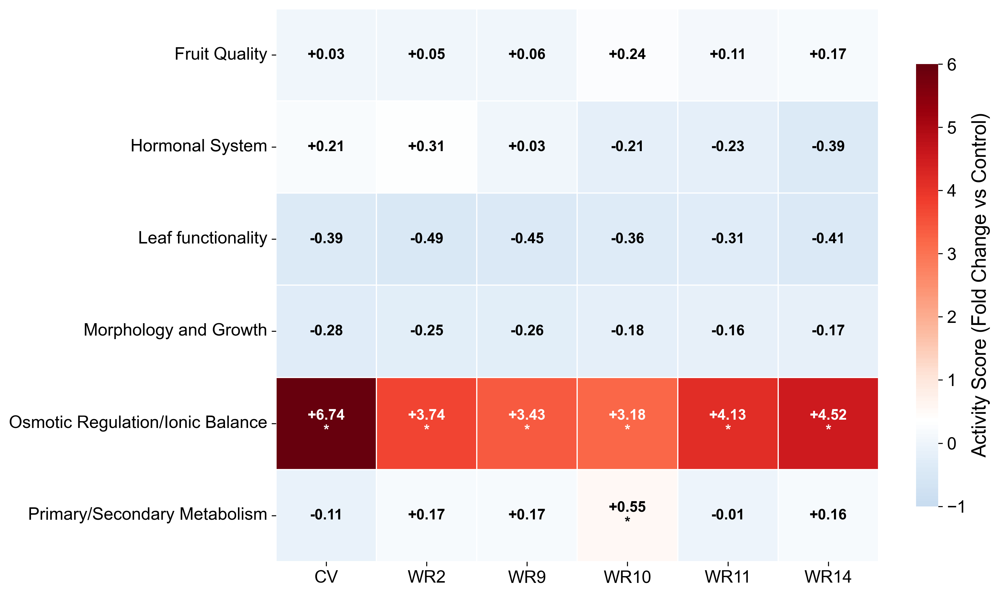


📊 Summary:
  ✓ Figure saved in PNG, SVG, and PDF formats


In [42]:
display(Markdown("### Generating Figure 1..."))

fig1_script = project_root / 'scripts' / 'figure_01_pathway_activity' / 'generate_pathway_heatmap.py'

if fig1_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig1_script)],
        cwd=str(project_root / 'scripts' / 'figure_01_pathway_activity'),
        capture_output=True,
        text=True,
        timeout=120
    )
    
    if result.returncode == 0:
        print("✅ Figure 1 generated successfully!")
        fig_path = project_root / 'scripts' / 'figure_01_pathway_activity' / 'figure_01_pathway_activity_heatmap.png'
        if fig_path.exists():
            display(Image(filename=str(fig_path), width=800))
        # Show output summary
        if result.stdout:
            print("\n📊 Summary:")
            for line in result.stdout.split('\n')[-10:]:
                if line.strip() and ('✅' in line or 'Figure' in line or '✓' in line):
                    print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-1000:])

## Figure 2: Adaptive Differences (WR vs CV) by Biological System

> **Dataset:** `data/master_dataset.csv`

Comparative analysis of wild accessions (WR2, WR9, WR10, WR11, WR14) versus cultivated variety (CV) under salt stress.

**Formula:** Adaptive Difference = (WR_mean - CV_mean) / |CV_mean|

**Biological Systems:**
1. Hormonal system (8 parameters)
2. Primary/secondary metabolism (7 parameters)
3. Osmotic regulation/ionic balance (6 parameters)
4. Leaf functionality (2 parameters)
5. Morphology and growth (11 parameters)
6. Fruit quality (9 parameters)

**Interpretation:**
- Positive values (red): WR performs better than CV
- Negative values (blue): CV performs better than WR
- Significance: * (>0.3), ** (>0.5), *** (>1.0)

### Generating Figure 2...

✅ Figure 2 generated successfully!


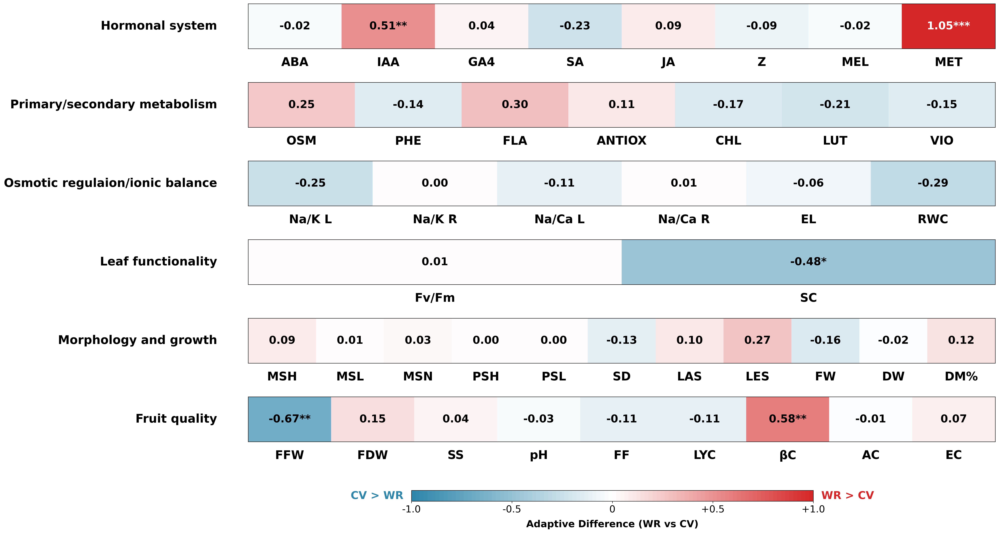


📊 Displayed: figure_02_adaptive_differences.png

Summary:
  ✅ Calculated 43 adaptive differences
  ✅ FIGURE 2 COMPLETED!


In [43]:
display(Markdown("### Generating Figure 2..."))

fig2_script = project_root / 'scripts' / 'figure_02_adaptive_differences' / 'generate_figure_02.py'

if fig2_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig2_script)],
        cwd=str(fig2_script.parent),
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 2 generated successfully!")
        
        # Display the generated PNG
        png_file = fig2_script.parent / 'figure_02_adaptive_differences.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1200))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✅' in line:
                        print(f"  {line}")
        else:
            print(f"⚠️ PNG file not found: {png_file}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig2_script}")

## Figure 3: Integrated Multi-Level Biological Network

> **Dataset:** `nodes_unified.csv` and `edges_unified.csv` (derived from master_dataset.csv, S2 treatment only)

Correlation network showing relationships between parameters across biological levels.

**Edge criteria:**
- Spearman correlation |R| > 0.3
- Statistical significance p < 0.05

**Network versions:**
- A) Full network (intra + cross-level connections)
- B) Cross-level only (inter-system connections)

### Standard Publication Versions (Thresholds: 0.35, -0.30)

#### A) Full Network (Intra + Cross level)

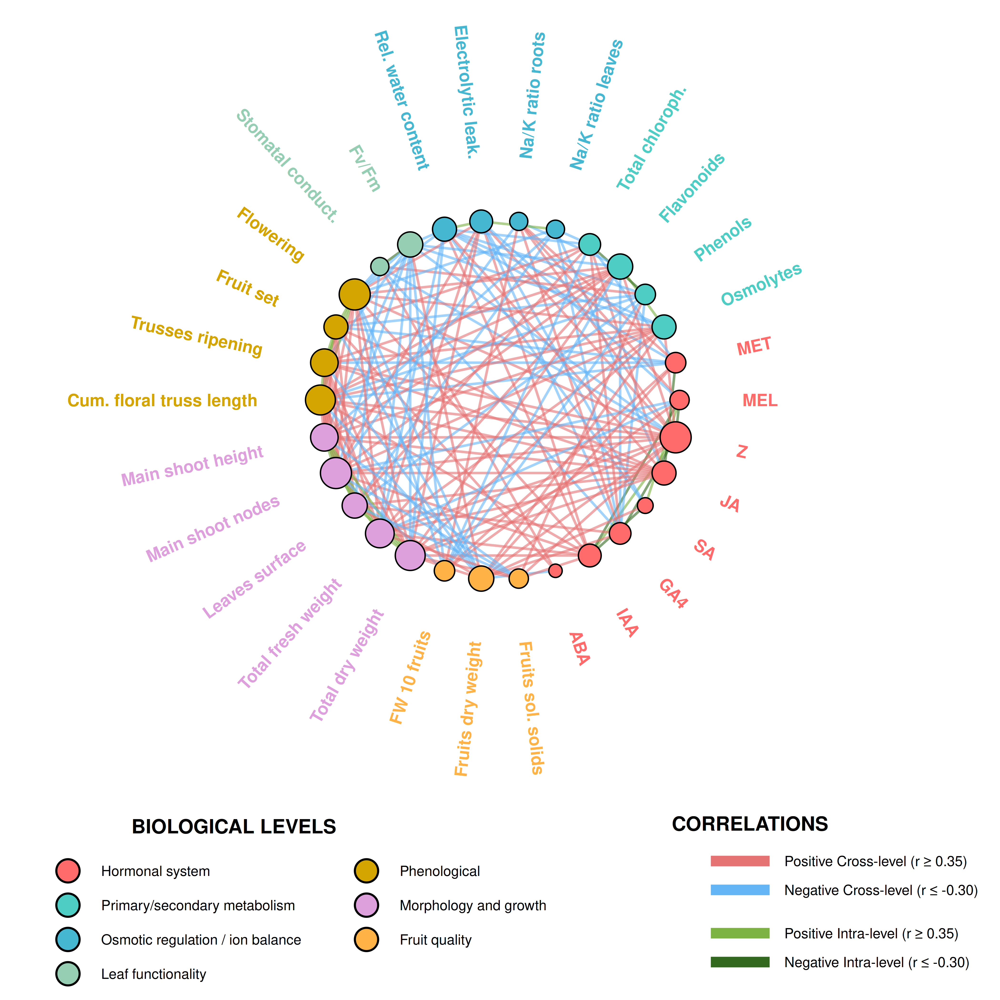

#### B) Cross-level Only Network (Filtered for manuscript)

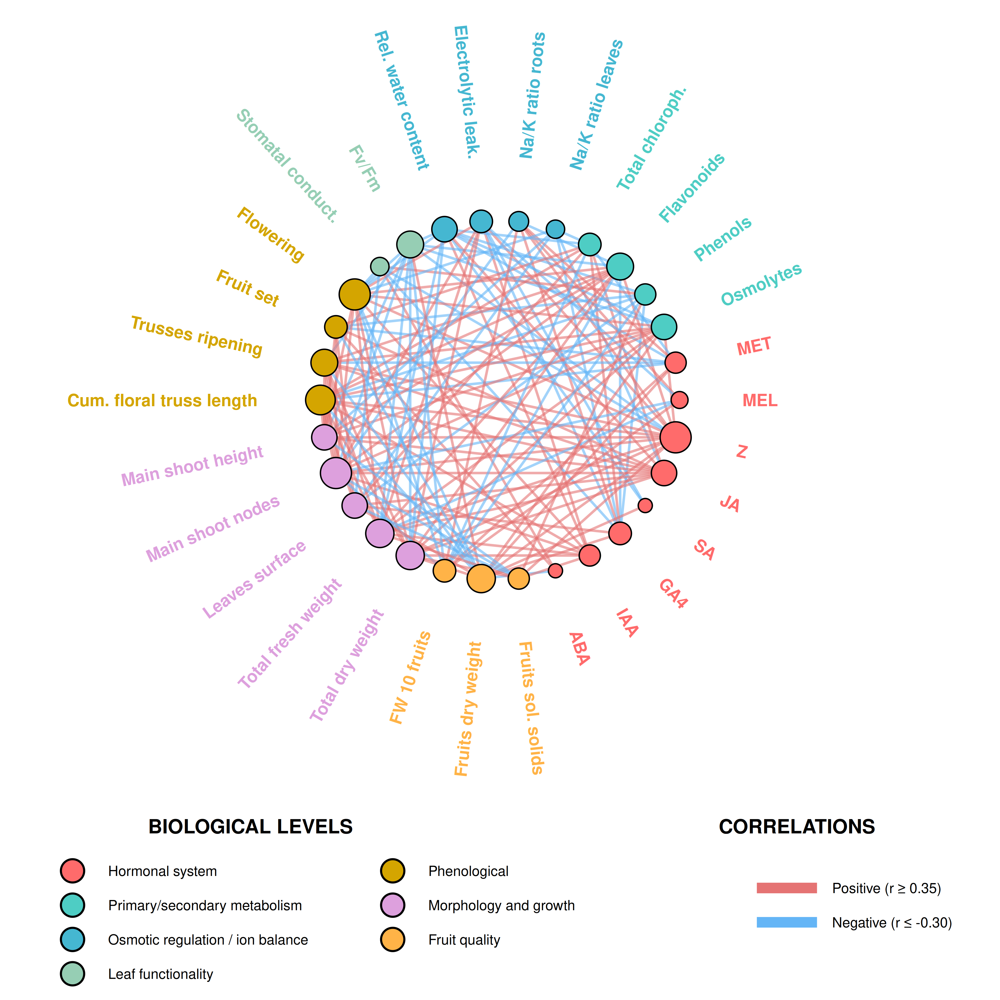

---

### Interactive Exploration Area

Output()

In [44]:
# FIGURE 3: INTEGRATED BIOLOGICAL NETWORK (VERSION 5.1)
import shutil
from IPython.display import display, Image, clear_output, Markdown
import ipywidgets as widgets
import subprocess

# 1. Path configuration
f3_r_script = project_root / "scripts" / "figure_03_network" / "generate_network_PUBLICATION_FINAL.R"
f3_R_COMMAND = shutil.which("Rscript")
f3_exact_path = f3_r_script.parent / "Figure_03_network_EXACT.png"
f3_cross_path = f3_r_script.parent / "Figure_03_network_CROSS_LEVEL_ONLY.png"

# 2. CLEAR ALL PREVIOUS GHOSTS
clear_output(wait=True)

# 3. Helper to generate and display figure
def generate_and_display(p_thr, n_thr, show_intra, show_cross, show_status=True):
    """Generate figure with R and display it."""
    if not f3_R_COMMAND:
        print("⚠️ Rscript not found - cannot generate Figure 3")
        print("   On Colab: Re-run the Setup cell to install R")
        return False
    
    if show_status:
        print(f"⏳ Generating network (thresholds: {p_thr}, {n_thr})...")
    
    result = subprocess.run(
        [f3_R_COMMAND, str(f3_r_script.name), str(p_thr), str(n_thr), 
         str(show_intra).upper(), str(show_cross).upper()],
        cwd=str(f3_r_script.parent),
        capture_output=True,
        text=True,
        timeout=120
    )
    
    if result.returncode != 0:
        print(f"❌ R script error:\n{result.stderr[:800]}")
        return False
    
    # Determine which file to show
    target = f3_exact_path if show_intra or not show_cross else f3_cross_path
    
    if target.exists():
        if show_status:
            print("✅ Generated!")
        display(Image(filename=str(target), width=800))
        return True
    else:
        print(f"❌ Output file not created: {target.name}")
        if result.stdout:
            print(f"R output: {result.stdout[:500]}")
        return False

# 4. DISPLAY STATIC PUBLICATION VERSIONS
display(Markdown("### Standard Publication Versions (Thresholds: 0.35, -0.30)"))

# Generate if needed
if not f3_exact_path.exists():
    display(Markdown("#### A) Full Network (Intra + Cross level)"))
    generate_and_display(0.35, -0.30, True, True)
else:
    display(Markdown("#### A) Full Network (Intra + Cross level)"))
    display(Image(filename=str(f3_exact_path), width=800))

if not f3_cross_path.exists():
    display(Markdown("#### B) Cross-level Only Network"))
    generate_and_display(0.35, -0.30, False, True)
else:
    display(Markdown("#### B) Cross-level Only Network (Filtered for manuscript)"))
    display(Image(filename=str(f3_cross_path), width=800))

display(Markdown("---"))
display(Markdown("### Interactive Exploration Area"))

# 5. INTERACTIVE LOGIC
def run_interactive_f3():
    if not f3_R_COMMAND:
        print("⚠️ Rscript not found - interactive mode disabled.")
        print("   On Colab: Re-run the Setup cell to install R")
        return

    # Widgets
    w_pos = widgets.FloatSlider(value=0.35, min=0.1, max=0.9, step=0.05, description="Pos r ≥:")
    w_neg = widgets.FloatSlider(value=-0.30, min=-0.9, max=-0.1, step=0.05, description="Neg r ≤:")
    w_intra = widgets.Checkbox(value=True, description="Show Intra-level")
    w_cross = widgets.Checkbox(value=True, description="Show Cross-level")
    w_btn = widgets.Button(description="Generate Figure", button_style="primary")
    
    # Isolated output for the interactive result
    w_out = widgets.Output()
    
    def on_click(b):
        with w_out:
            clear_output(wait=True)
            b.disabled = True
            b.description = "⏳ Processing..."
            try:
                display(Markdown(f"**Dynamic Result:** (r ≥ {w_pos.value} / r ≤ {w_neg.value})"))
                generate_and_display(w_pos.value, w_neg.value, w_intra.value, w_cross.value, show_status=False)
            finally:
                b.disabled = False
                b.description = "Generate Figure"
    
    w_btn.on_click(on_click)
    display(widgets.VBox([widgets.HBox([w_pos, w_neg]), widgets.HBox([w_intra, w_cross]), w_btn]), w_out)

run_interactive_f3()


## Figure 4: Phenological Timing Analysis (GDD-Based)

> **Dataset:** `data/master_dataset.csv`

Growing Degree Days (GDD) analysis of phenological development under salt stress.

**Panel a:** GDD Cumulative Heatmap
- Rows: 18 variety-treatment combinations (6 genotypes × 3 treatments)
- Columns: 4 phenological phases (Vegetative, Flowering, Fruit set, Fruit ripening)

**Panel b:** Phenological Delay (%) relative to control
- Points colored by treatment intensity (S1, S2)
- Reference line at 0% (no delay)

### Generating Figure 4...

✅ Figure 4 generated successfully!


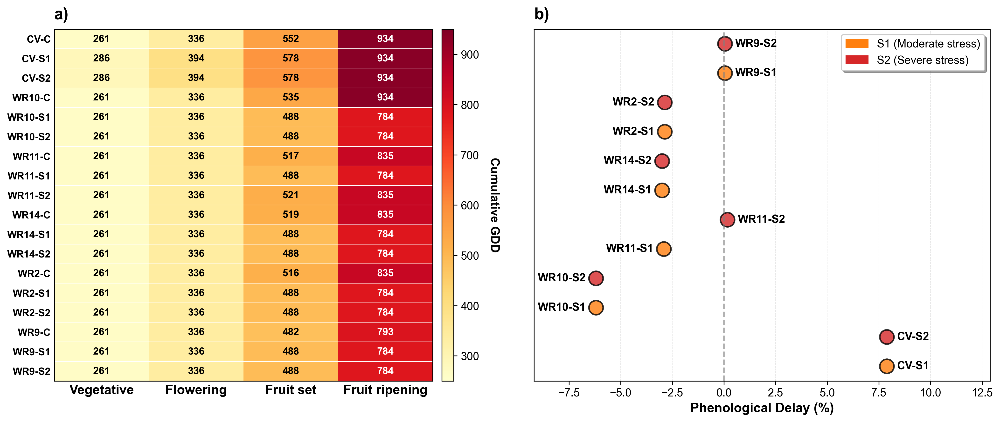


📊 Displayed: figure_04_phenological_timing.png

Summary:
  ✓ Master dataset loaded: 1173 rows
     ✓ Data loaded for 6 varieties
     ✓ Effects calculated for 6 varieties
  ✅ PNG: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_04_phenological_timing/figure_04_phenological_timing.png
  ✅ PDF: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_04_phenological_timing/figure_04_phenological_timing.pdf
  ✅ COMPLETED!


In [45]:
display(Markdown("### Generating Figure 4..."))

fig4_script = project_root / 'scripts' / 'figure_04_phenological_timing' / 'generate_figure_04.py'

if fig4_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig4_script)],
        cwd=fig4_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 4 generated successfully!")
        
        png_file = fig4_script.parent / 'figure_04_phenological_timing.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✓' in line or '✅' in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig4_script}")

## Figure 5: Temporal Dynamics of Phenological Development

> **Dataset:** `data/master_dataset.csv`

Temporal progression of phenological parameters across treatment conditions (Control, S1, S2) for all six genotypes.

**Panels:**
- **a-c:** Main shoot height (cm)
- **d-f:** Flowering (trusses number)
- **g-i:** Fruit set (trusses number)
- **l-n:** Fruit ripening (trusses number)

**Genotypes:** CV (reference, black), WR2, WR9, WR10, WR11, WR14

**Statistics:** 
- Error bands: mean ± SE
- Significance asterisks: Welch's t-test (WR vs CV) with Bonferroni correction (×5)
- Significance levels: * p<0.05, ** p<0.01, *** p<0.001

**Note:** DAT 98 excluded for Fruit set and Fruit ripening (post-destructive sampling)

### Generating Figure 5...

✅ Figure 5 generated successfully!


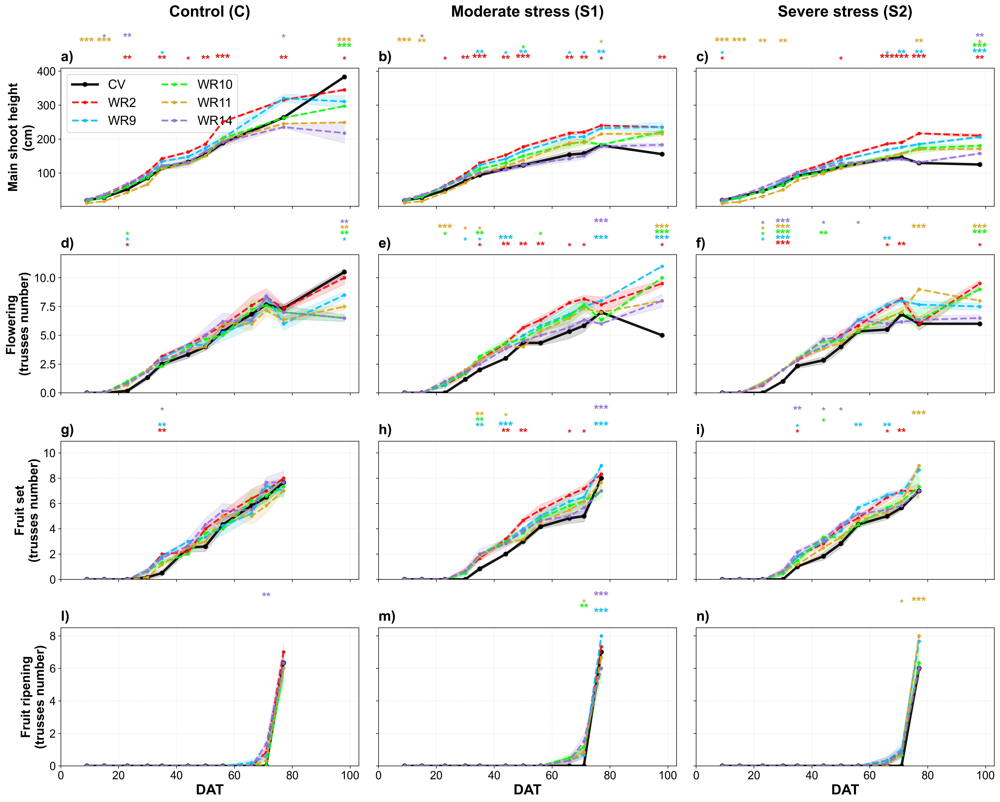


📊 Displayed: figure_05_temporal_dynamics.png

Summary:
  ✅ PNG: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/figure_05_temporal_dynamics/figure_05_temporal_dynamics.png


In [46]:
display(Markdown("### Generating Figure 5..."))

fig5_script = project_root / 'scripts' / 'figure_05_temporal_dynamics' / 'generate_figure_05.py'

if fig5_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig5_script)],
        cwd=fig5_script.parent,
        capture_output=True,
        text=True,
        timeout=300
    )
    
    if result.returncode == 0:
        print("✅ Figure 5 generated successfully!")
        
        png_file = fig5_script.parent / 'figure_05_temporal_dynamics.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1400))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show summary
            if result.stdout:
                print("\nSummary:")
                for line in result.stdout.split('\n'):
                    if '✅' in line and 'PNG' in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig5_script}")

## Figure 6: Variety Ranking and Category Contribution

> **Dataset:** `data/master_dataset.csv`

Composite salt tolerance ranking based on weighted category scores.

**Panel a:** Final Stress Tolerance Ranking (total scores)

**Panel b:** Category Contribution (stacked bars)

**Categories and Weights:**
- Performance Maintenance: 0.55
- Physiological Stability: 0.25
- Stress Marker Response: 0.20

### Generating Figure 6...

✅ Figure 6 generated successfully!
   Data: CALCULATED from real dataset


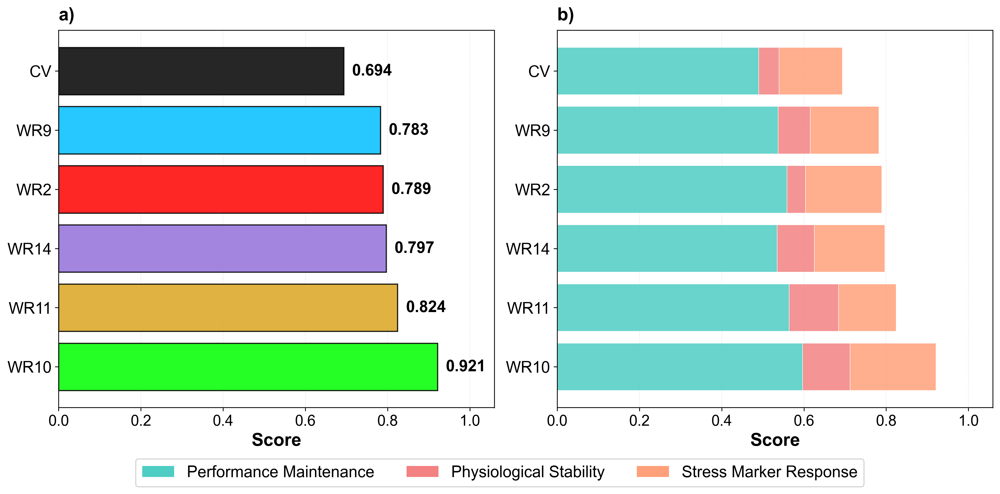


📊 Displayed: figure_06_variety_ranking.png

Ranking calculated:
      TOTALE: 0.694
      TOTALE: 0.789
      TOTALE: 0.783
      TOTALE: 0.921
      TOTALE: 0.824
      TOTALE: 0.797


In [47]:
display(Markdown("### Generating Figure 6..."))

fig6_script = project_root / "scripts" / "figure_06_variety_ranking" / "generate_figure_06.py"

if fig6_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig6_script)],
        cwd=fig6_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 6 generated successfully!")
        print("   Data: CALCULATED from real dataset")
        
        png_file = fig6_script.parent / "figure_06_variety_ranking.png"
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
            
            # Show ranking
            if result.stdout:
                print("\nRanking calculated:")
                for line in result.stdout.split("\n"):
                    if "TOTALE:" in line:
                        print(f"  {line}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig6_script}")

## Figure 7: Parameter Responsiveness Heatmap by Category

> **Dataset:** `data/parameter_ranking_unified.csv` (derived from master_dataset.csv)

Statistical responsiveness of 12 key parameters to salt stress, comparing WR10 (wild) and CV (cultivated).

**Score Formula:** Combined Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)

**Metrics displayed:**
- F-statistic contribution (ANOVA)
- Effect size η² contribution (variance explained)
- % Change contribution (Control → S2)
- Combined Score

**Categories:** Performance Maintenance, Physiological Stability, Stress Marker Response

### Generating Figure 7...

✅ Figure 7 generated successfully!


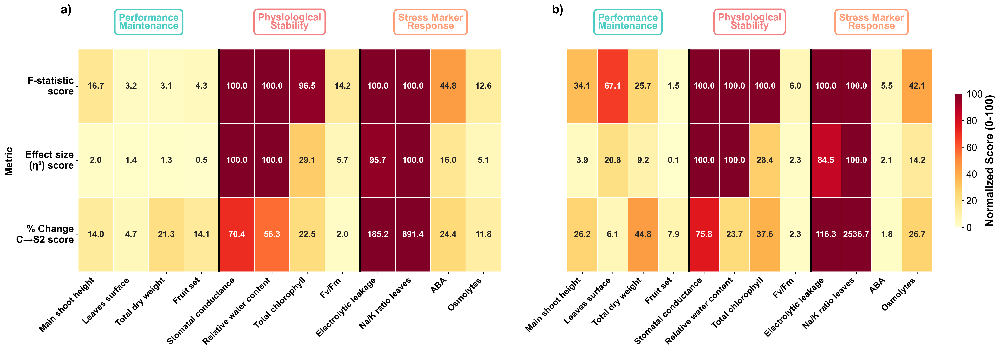


📊 Displayed: figure_07_parameter_responsiveness.png


In [48]:
display(Markdown("### Generating Figure 7..."))

fig7_script = project_root / "scripts" / "figure_07_responsiveness" / "generate_figure_07.py"

if fig7_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig7_script)],
        cwd=fig7_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 7 generated successfully!")
        
        png_file = fig7_script.parent / "figure_07_parameter_responsiveness.png"
        if png_file.exists():
            display(Image(filename=str(png_file), width=1400))
            print(f"\n📊 Displayed: {png_file.name}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])
else:
    print(f"⚠️ Script not found: {fig7_script}")

## Figure 8: Regression Comparison (WR10 vs CV)

> **Dataset:** `data/master_dataset.csv`

Dose-response regression analysis comparing WR10 (*S. pimpinellifolium*) and CV (*S. lycopersicum*).

**Salinity gradient:** Control (3.22 mS/cm), S1 (11.0 mS/cm), S2 (21.0 mS/cm)

**Panels:**
- **a)** Main Shoot Height - Performance Maintenance (linear regression)
- **b)** Stomatal Conductance - Physiological Stability (linear regression)
- **c)** Na/K ratio leaves - Stress Marker Response (exponential regression)

**Statistics:** R² values with 95% confidence intervals

### Generating Figure 8...

✅ Figure 8 generated successfully!


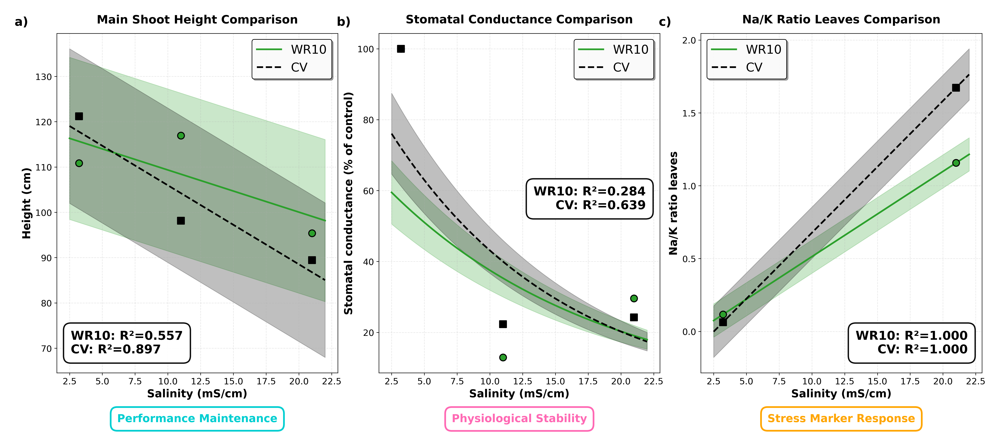


📊 Displayed: figure_08_regression_comparison.png


In [49]:
display(Markdown("### Generating Figure 8..."))

fig8_script = project_root / 'scripts' / 'figure_08_regression_comparison' / 'generate_figure_08.py'

if fig8_script.exists():
    result = subprocess.run(
        [sys.executable, str(fig8_script)],
        cwd=fig8_script.parent,
        capture_output=True,
        text=True,
        timeout=180
    )
    
    if result.returncode == 0:
        print("✅ Figure 8 generated successfully!")
        
        png_file = fig8_script.parent / 'figure_08_regression_comparison.png'
        if png_file.exists():
            display(Image(filename=str(png_file), width=1000))
            print(f"\n📊 Displayed: {png_file.name}")
    else:
        print("❌ Error:")
        print(result.stderr[-500:])

---

# Supplementary Materials

Supplementary figures showing detailed pathway activity heatmaps by biological system, and parameter ranking tables.

| Item | Description |
|------|-------------|
| **Fig. S1** | Osmotic Regulation/Ionic Balance |
| **Fig. S2** | Primary/Secondary Metabolism |
| **Fig. S3** | Hormonal System |
| **Fig. S4** | Morphology and Growth |
| **Fig. S5** | Fruit Quality |
| **Fig. S6** | Leaf Functionality |
| **Tab. S2** | Parameter Scores for CV and WR10 |

In [50]:
# Supplementary Materials Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Output directory for supplementary figures
sm_output_dir = project_root / 'scripts' / 'supplementary_figures'
sm_output_dir.mkdir(parents=True, exist_ok=True)

# Load master dataset
sm_data_path = project_root / 'data' / 'master_dataset.csv'
df_sm = pd.read_csv(sm_data_path)
print(f"Dataset loaded for SM: {len(df_sm)} rows, {len(df_sm.columns)} columns")

VARIETIES = ['CV', 'WR2', 'WR9', 'WR10', 'WR11', 'WR14']

def calculate_activity_score(df, param, variety):
    """Calculate Activity Score (Fold Change vs Control)"""
    control_data = df[(df['Treatment'] == 'C') & (df['Variety'] == variety)][param].dropna()
    stress_data = df[(df['Treatment'] == 'S2') & (df['Variety'] == variety)][param].dropna()
    if len(control_data) == 0 or len(stress_data) == 0:
        return np.nan
    control_mean = control_data.mean()
    stress_mean = stress_data.mean()
    if control_mean == 0:
        return np.nan
    return (stress_mean - control_mean) / control_mean

def calculate_significance(df, param, variety):
    """Calculate statistical significance using Welch's t-test"""
    control_data = df[(df['Treatment'] == 'C') & (df['Variety'] == variety)][param].dropna()
    stress_data = df[(df['Treatment'] == 'S2') & (df['Variety'] == variety)][param].dropna()
    if len(control_data) < 2 or len(stress_data) < 2:
        return np.nan, ''
    try:
        t_stat, p_value = stats.ttest_ind(control_data, stress_data, equal_var=False)
        if p_value < 0.001:
            sig = '***'
        elif p_value < 0.01:
            sig = '**'
        elif p_value < 0.05:
            sig = '*'
        else:
            sig = ''
        return p_value, sig
    except:
        return np.nan, ''

def create_heatmap_data(df, params):
    """Create matrix for heatmap: parameters (rows) x varieties (columns)"""
    data_matrix = []
    sig_matrix = []
    for param in params:
        row_data = []
        row_sig = []
        for variety in VARIETIES:
            score = calculate_activity_score(df, param, variety)
            p_val, sig = calculate_significance(df, param, variety)
            row_data.append(score)
            row_sig.append(sig)
        data_matrix.append(row_data)
        sig_matrix.append(row_sig)
    return np.array(data_matrix), sig_matrix

def plot_sm_heatmap(data_matrix, sig_matrix, params, title, vmin=-3, vmax=3, text_threshold=1.5):
    """Plot heatmap with activity scores and significance asterisks"""
    fig, ax = plt.subplots(figsize=(10, max(6, len(params) * 0.8)))
    cmap = sns.diverging_palette(240, 10, as_cmap=True)
    im = ax.imshow(data_matrix, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label('Activity Score (Fold Change vs Control)', fontsize=11, fontweight='bold')
    ax.set_xticks(range(len(VARIETIES)))
    ax.set_xticklabels(VARIETIES, fontsize=12, fontweight='bold')
    ax.set_yticks(range(len(params)))
    ax.set_yticklabels(params, fontsize=11)
    for i in range(len(params)):
        for j in range(len(VARIETIES)):
            value = data_matrix[i, j]
            sig = sig_matrix[i][j]
            if np.isnan(value):
                text = 'N/A'
            else:
                text = f'{value:.2f}'
                if sig:
                    text = f'{value:.2f}\n{sig}'
            text_color = 'white' if abs(value) > text_threshold else 'black'
            ax.text(j, i, text, ha='center', va='center', fontsize=10, fontweight='bold', color=text_color)
    for i in range(len(params) + 1):
        ax.axhline(i - 0.5, color='white', linewidth=0.5)
    for j in range(len(VARIETIES) + 1):
        ax.axvline(j - 0.5, color='white', linewidth=0.5)
    ax.tick_params(length=0)
    ax.set_title(title, fontsize=14, fontweight='bold', pad=15)
    plt.tight_layout()
    return fig

print("SM functions defined successfully!")

Dataset loaded for SM: 1173 rows, 69 columns
SM functions defined successfully!


## Figure S1: Osmotic Regulation/Ionic Balance

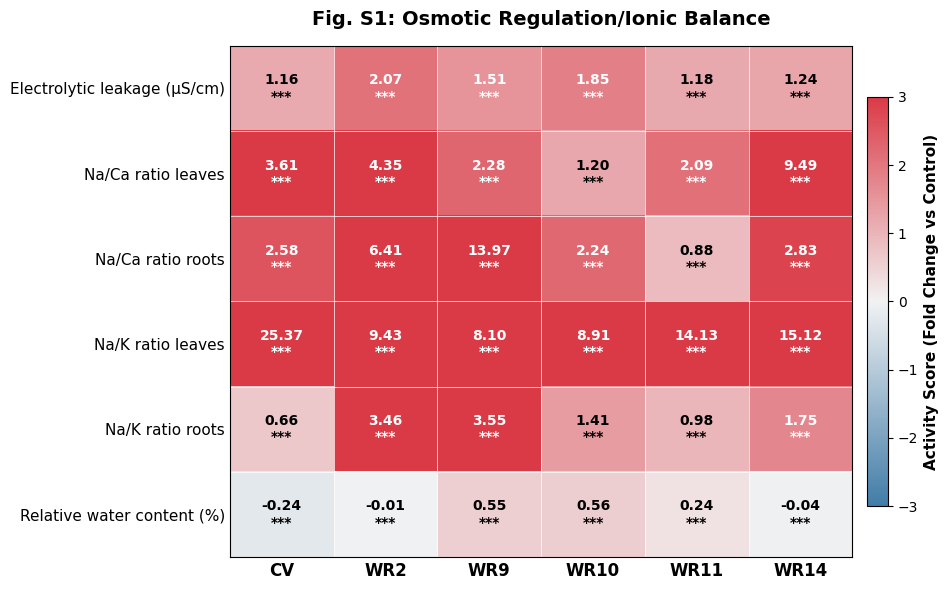

✅ Figure S1 saved!


In [51]:
S1_PARAMS = [
    'Electrolytic leakage (μS/cm)',
    'Na/Ca ratio leaves',
    'Na/Ca ratio roots',
    'Na/K ratio leaves',
    'Na/K ratio roots',
    'Relative water content (%)'
]

data_S1, sig_S1 = create_heatmap_data(df_sm, S1_PARAMS)
fig_S1 = plot_sm_heatmap(data_S1, sig_S1, S1_PARAMS, 
                         'Fig. S1: Osmotic Regulation/Ionic Balance',
                         vmin=-3, vmax=3, text_threshold=1.5)
plt.show()
fig_S1.savefig(sm_output_dir / 'figure_S1_osmotic_regulation.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S1 saved!")

## Figure S2: Primary/Secondary Metabolism

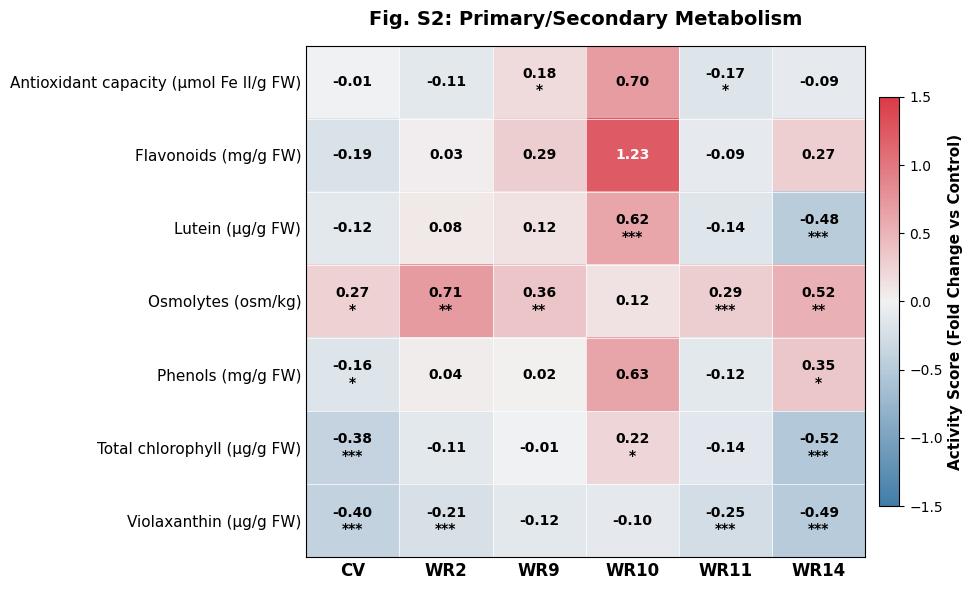

✅ Figure S2 saved!


In [52]:
S2_PARAMS = [
    'Antioxidant capacity (μmol Fe II/g FW)',
    'Flavonoids (mg/g FW)',
    'Lutein (μg/g FW)',
    'Osmolytes (osm/kg)',
    'Phenols (mg/g FW)',
    'Total chlorophyll (μg/g FW)',
    'Violaxanthin (μg/g FW)'
]

data_S2, sig_S2 = create_heatmap_data(df_sm, S2_PARAMS)
fig_S2 = plot_sm_heatmap(data_S2, sig_S2, S2_PARAMS, 
                         'Fig. S2: Primary/Secondary Metabolism',
                         vmin=-1.5, vmax=1.5, text_threshold=0.8)
plt.show()
fig_S2.savefig(sm_output_dir / 'figure_S2_metabolism.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S2 saved!")

## Figure S3: Hormonal System

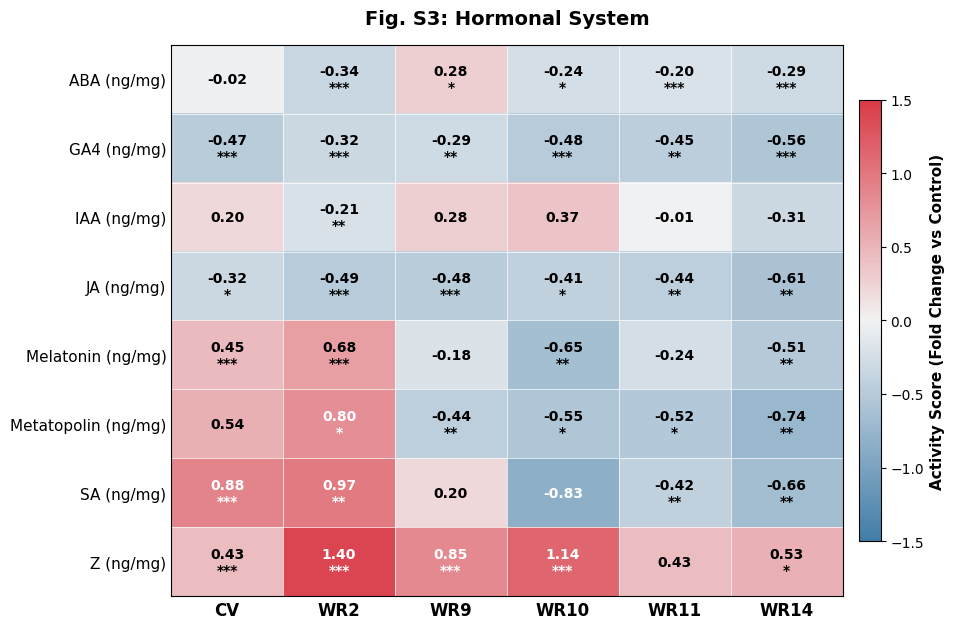

✅ Figure S3 saved!


In [53]:
S3_PARAMS = [
    'ABA (ng/mg)',
    'GA4 (ng/mg)',
    'IAA (ng/mg)',
    'JA (ng/mg)',
    'Melatonin (ng/mg)',
    'Metatopolin (ng/mg)',
    'SA (ng/mg)',
    'Z (ng/mg)'
]

data_S3, sig_S3 = create_heatmap_data(df_sm, S3_PARAMS)
fig_S3 = plot_sm_heatmap(data_S3, sig_S3, S3_PARAMS, 
                         'Fig. S3: Hormonal System',
                         vmin=-1.5, vmax=1.5, text_threshold=0.8)
plt.show()
fig_S3.savefig(sm_output_dir / 'figure_S3_hormonal.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S3 saved!")

## Figure S4: Morphology and Growth

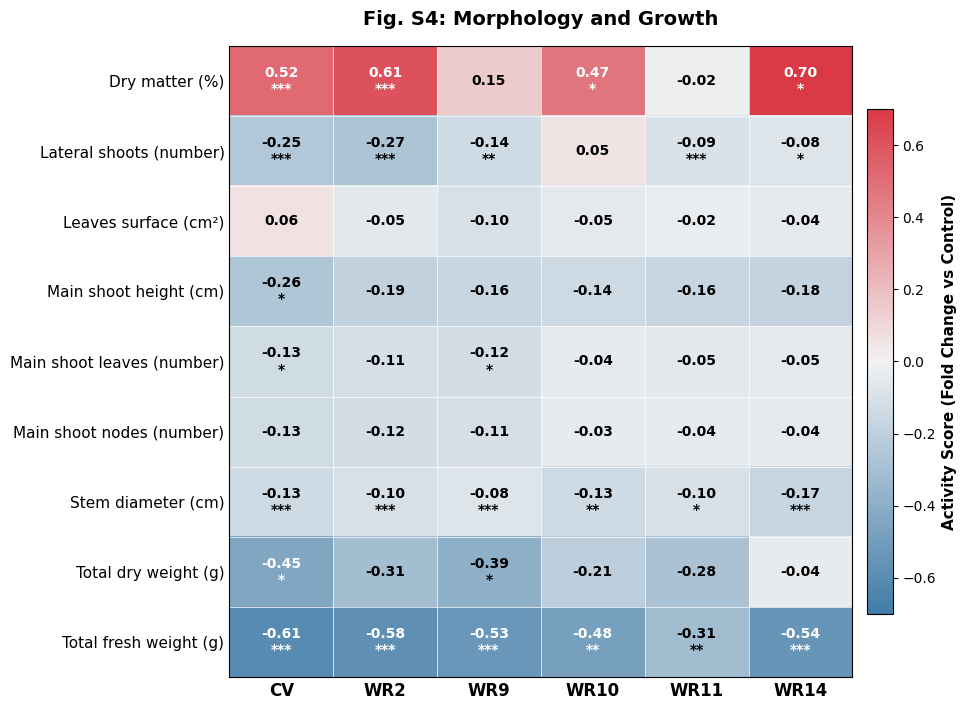

✅ Figure S4 saved!


In [54]:
S4_PARAMS = [
    'Dry matter (%)',
    'Lateral shoots (number)',
    'Leaves surface (cm²)',
    'Main shoot height (cm)',
    'Main shoot leaves (number)',
    'Main shoot nodes (number)',
    'Stem diameter (cm)',
    'Total dry weight (g)',
    'Total fresh weight (g)'
]

data_S4, sig_S4 = create_heatmap_data(df_sm, S4_PARAMS)
fig_S4 = plot_sm_heatmap(data_S4, sig_S4, S4_PARAMS, 
                         'Fig. S4: Morphology and Growth',
                         vmin=-0.7, vmax=0.7, text_threshold=0.4)
plt.show()
fig_S4.savefig(sm_output_dir / 'figure_S4_morphology.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S4 saved!")

## Figure S5: Fruit Quality

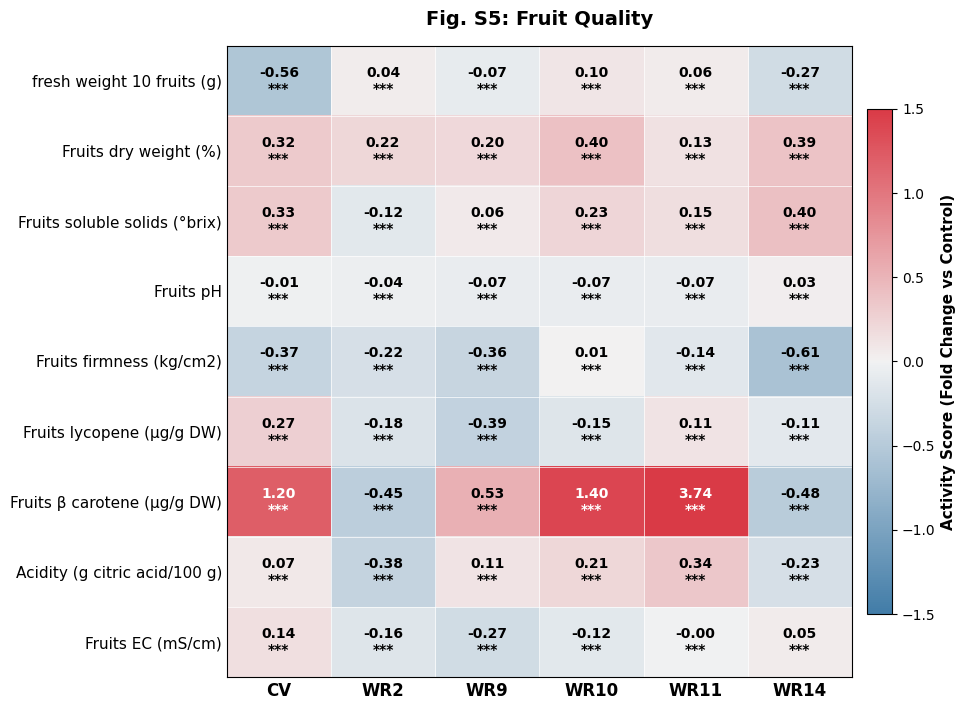

✅ Figure S5 saved!


In [55]:
S5_PARAMS = [
    'fresh weight 10 fruits (g)',
    'Fruits dry weight (%)',
    'Fruits soluble solids (°brix)',
    'Fruits pH',
    'Fruits firmness (kg/cm2)',
    'Fruits lycopene (μg/g DW)',
    'Fruits β carotene (μg/g DW)',
    'Acidity (g citric acid/100 g)',
    'Fruits EC (mS/cm)'
]

data_S5, sig_S5 = create_heatmap_data(df_sm, S5_PARAMS)
fig_S5 = plot_sm_heatmap(data_S5, sig_S5, S5_PARAMS, 
                         'Fig. S5: Fruit Quality',
                         vmin=-1.5, vmax=1.5, text_threshold=0.8)
plt.show()
fig_S5.savefig(sm_output_dir / 'figure_S5_fruit_quality.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S5 saved!")

## Figure S6: Leaf Functionality

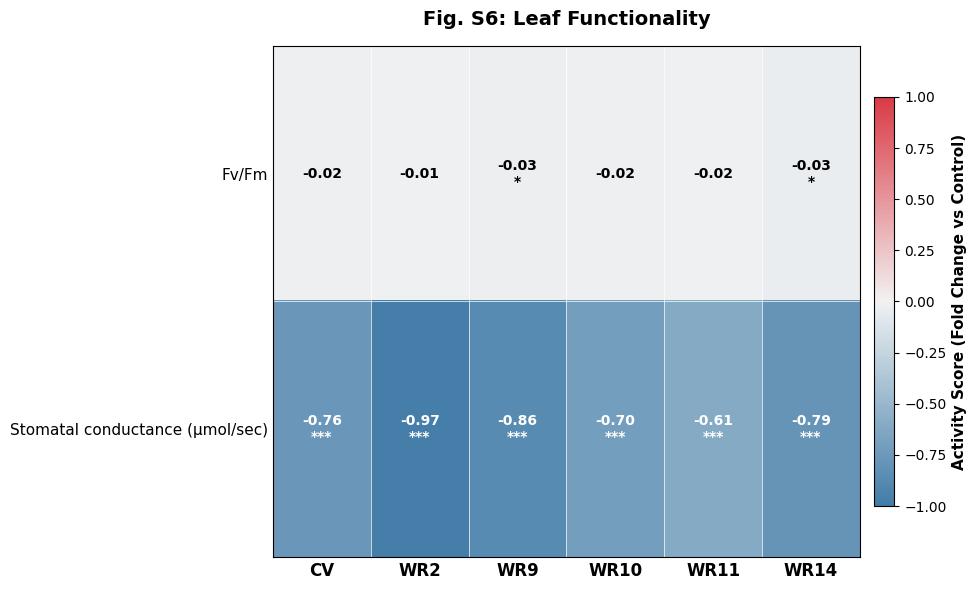

✅ Figure S6 saved!


In [56]:
S6_PARAMS = [
    'Fv/Fm',
    'Stomatal conductance (μmol/sec)'
]

data_S6, sig_S6 = create_heatmap_data(df_sm, S6_PARAMS)
fig_S6 = plot_sm_heatmap(data_S6, sig_S6, S6_PARAMS, 
                         'Fig. S6: Leaf Functionality',
                         vmin=-1.0, vmax=1.0, text_threshold=0.5)
plt.show()
fig_S6.savefig(sm_output_dir / 'figure_S6_leaf_functionality.png', 
               dpi=300, bbox_inches='tight', facecolor='white')
print("✅ Figure S6 saved!")

## Table S2: Parameter Scores and Rankings

Combined responsiveness scores comparing wild (WR10) and cultivated (CV) genotypes.

**Score Formula:** Combined Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)

Where:
- F_score = normalized F-statistic from one-way ANOVA
- η²_score = variance explained by treatment (eta-squared × 100)
- %Change_score = |% change from Control to S2|

**Categories:** Performance Maintenance (4 params), Physiological Stability (4 params), Stress Marker Response (4 params)

In [59]:
# === TABLE S2: Parameter Scores and Rankings ===
# Formula from Materials & Methods: Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)

# Load pre-calculated scores from unified data pipeline
ranking_path = project_root / 'data' / 'parameter_ranking_unified.csv'
df_ranking = pd.read_csv(ranking_path)

# Define parameters for Table S2 (12 parameters across 3 categories)
TABLE_S2_PARAMS = {
    'Performance Maintenance': [
        'Main shoot height (cm)', 'Leaves surface (cm²)', 'Total dry weight (g)', 'Fruit set (trusses number)'
    ],
    'Physiological Stability': [
        'Stomatal conductance (μmol/sec)', 'Relative water content (%)', 
        'Total chlorophyll (μg/g FW)', 'Fv/Fm'
    ],
    'Stress Marker Response': [
        'Electrolytic leakage (μS/cm)', 'Na/K ratio leaves', 'ABA (ng/mg)', 'Osmolytes (osm/kg)'
    ]
}

# Get category for each param
param_to_cat = {}
for cat, params in TABLE_S2_PARAMS.items():
    for p in params:
        param_to_cat[p] = cat

# Filter for CV and WR10 only
df_cv_wr10 = df_ranking[df_ranking['variety'].isin(['CV', 'WR10'])].copy()

# Filter for our selected parameters
all_params = [p for params in TABLE_S2_PARAMS.values() for p in params]
df_filtered = df_cv_wr10[df_cv_wr10['parameter'].isin(all_params)].copy()

# Calculate Combined Score using the formula from Materials & Methods:
# Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)
df_filtered['Score'] = (df_filtered['f_stat_score'] * 0.4) + \
                       (df_filtered['eta_sq_score'] * 0.4) + \
                       (df_filtered['pct_change_score'] * 0.2)

# Calculate rankings within each variety (1 = highest score = most responsive)
for variety in ['CV', 'WR10']:
    mask = df_filtered['variety'] == variety
    df_filtered.loc[mask, 'Ranking'] = df_filtered.loc[mask, 'Score'].rank(ascending=False, method='min').astype(int)

# ============================================================
# TABLE A: Overall Ranking (mean across varieties)
# ============================================================
df_overall = df_filtered.groupby('parameter').agg({'Score': 'mean'}).reset_index()
df_overall['Category'] = df_overall['parameter'].map(param_to_cat)
df_overall = df_overall.sort_values('Score', ascending=False)
df_overall['Ranking'] = range(1, len(df_overall) + 1)
df_overall['Score'] = df_overall['Score'].apply(lambda x: f'{x:.2f}')
table_overall = df_overall[['Ranking', 'parameter', 'Category', 'Score']].copy()
table_overall.columns = ['Ranking', 'Parameter', 'Category', 'Score']

# ============================================================
# TABLE B: By Variety (WR10 vs CV comparison)
# ============================================================
rows_variety = []
for param in all_params:
    row = {'Parameter': param, 'Category': param_to_cat[param]}
    for variety in ['WR10', 'CV']:
        param_data = df_filtered[(df_filtered['parameter'] == param) & (df_filtered['variety'] == variety)]
        if not param_data.empty:
            row[f'{variety} Score'] = f'{param_data["Score"].values[0]:.2f}'
            row[f'{variety} Ranking'] = int(param_data['Ranking'].values[0])
        else:
            row[f'{variety} Score'] = 'n.a.'
            row[f'{variety} Ranking'] = '-'
    rows_variety.append(row)

table_by_variety = pd.DataFrame(rows_variety)
# Sort by WR10 ranking
table_by_variety['sort_key'] = table_by_variety['WR10 Ranking'].apply(lambda x: x if isinstance(x, int) else 99)
table_by_variety = table_by_variety.sort_values('sort_key').drop('sort_key', axis=1)

# ============================================================
# TABLE C: Overall Ranking BY CATEGORY (mean across varieties)
# ============================================================
tables_overall_by_cat = {}
for cat in ['Performance Maintenance', 'Physiological Stability', 'Stress Marker Response']:
    df_cat = table_overall[table_overall['Category'] == cat].copy()
    # Re-rank within category
    df_cat['Ranking'] = range(1, len(df_cat) + 1)
    tables_overall_by_cat[cat] = df_cat[['Ranking', 'Parameter', 'Score']].copy()

# ============================================================
# TABLE D: By Variety BY CATEGORY
# ============================================================
tables_variety_by_cat = {}
for cat in ['Performance Maintenance', 'Physiological Stability', 'Stress Marker Response']:
    df_cat = table_by_variety[table_by_variety['Category'] == cat].copy()
    df_cat = df_cat.drop('Category', axis=1)
    # Re-rank within category for each variety
    df_cat['WR10 Rank'] = range(1, len(df_cat) + 1)
    # Re-sort by CV and get CV rank
    df_cat_cv = df_cat.copy()
    df_cat_cv['CV_score_num'] = df_cat_cv['CV Score'].apply(lambda x: float(x) if x != 'n.a.' else 0)
    df_cat_cv = df_cat_cv.sort_values('CV_score_num', ascending=False)
    cv_rank_map = {p: i+1 for i, p in enumerate(df_cat_cv['Parameter'])}
    df_cat['CV Rank'] = df_cat['Parameter'].map(cv_rank_map)
    # Reorder columns
    df_cat = df_cat[['Parameter', 'WR10 Score', 'WR10 Rank', 'CV Score', 'CV Rank']]
    tables_variety_by_cat[cat] = df_cat

# ============================================================
# DISPLAY
# ============================================================
print("="*90)
print("TABLE S2: Parameter Scores and Rankings")
print("="*90)
print("\nFormula: Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)")

# --- VERSION 1: ALL PARAMETERS TOGETHER ---
print("\n" + "="*90)
print("VERSION 1: ALL PARAMETERS TOGETHER")
print("="*90)

print("\n" + "-"*90)
print("A) OVERALL RANKING (mean score across WR10 and CV)")
print("-"*90)
display(table_overall.reset_index(drop=True))

print("\n" + "-"*90)
print("B) BY VARIETY (sorted by WR10 ranking)")
print("-"*90)
display(table_by_variety.reset_index(drop=True))

# --- VERSION 2: SEPARATED BY CATEGORY ---
print("\n" + "="*90)
print("VERSION 2: SEPARATED BY CATEGORY")
print("="*90)

print("\n" + "-"*90)
print("C) OVERALL RANKING BY CATEGORY (mean score across WR10 and CV)")
print("-"*90)
for cat in ['Performance Maintenance', 'Physiological Stability', 'Stress Marker Response']:
    print(f"\n📌 {cat.upper()}")
    display(tables_overall_by_cat[cat].reset_index(drop=True))

print("\n" + "-"*90)
print("D) BY VARIETY, BY CATEGORY")
print("-"*90)
for cat in ['Performance Maintenance', 'Physiological Stability', 'Stress Marker Response']:
    print(f"\n📌 {cat.upper()}")
    display(tables_variety_by_cat[cat].reset_index(drop=True))

# Save tables (all versions)
csv_overall = sm_output_dir / 'table_S2_overall_ranking.csv'
table_overall.to_csv(csv_overall, index=False)

csv_variety = sm_output_dir / 'table_S2_by_variety.csv'
table_by_variety.to_csv(csv_variety, index=False)

# Save category-separated versions
for cat in ['Performance Maintenance', 'Physiological Stability', 'Stress Marker Response']:
    cat_short = cat.replace(' ', '_').lower()
    tables_overall_by_cat[cat].to_csv(sm_output_dir / f'table_S2_overall_{cat_short}.csv', index=False)
    tables_variety_by_cat[cat].to_csv(sm_output_dir / f'table_S2_variety_{cat_short}.csv', index=False)

print(f"\n✅ Tables saved to: {sm_output_dir}")
print("   - table_S2_overall_ranking.csv")
print("   - table_S2_by_variety.csv")
print("   - table_S2_overall_performance_maintenance.csv")
print("   - table_S2_overall_physiological_stability.csv")
print("   - table_S2_overall_stress_marker_response.csv")
print("   - table_S2_variety_performance_maintenance.csv")
print("   - table_S2_variety_physiological_stability.csv")
print("   - table_S2_variety_stress_marker_response.csv")

TABLE S2: Parameter Scores and Rankings

Formula: Score = (F_score × 0.4) + (η²_score × 0.4) + (%Change_score × 0.2)

VERSION 1: ALL PARAMETERS TOGETHER

------------------------------------------------------------------------------------------
A) OVERALL RANKING (mean score across WR10 and CV)
------------------------------------------------------------------------------------------


,Ranking,Parameter,Category,Score
0,1,Na/K ratio leaves,Stress Marker Response,422.82
1,2,Electrolytic leakage (μS/cm),Stress Marker Response,106.19
2,3,Stomatal conductance (μmol/sec),Physiological Stability,94.62
3,4,Relative water content (%),Physiological Stability,88.00
4,5,Total chlorophyll (μg/g FW),Physiological Stability,56.79
5,6,Leaves surface (cm²),Performance Maintenance,19.59
6,7,Osmolytes (osm/kg),Stress Marker Response,18.64
7,8,ABA (ng/mg),Stress Marker Response,16.31
8,9,Main shoot height (cm),Performance Maintenance,15.34
9,10,Total dry weight (g),Performance Maintenance,14.47



------------------------------------------------------------------------------------------
B) BY VARIETY (sorted by WR10 ranking)
------------------------------------------------------------------------------------------


,Parameter,Category,WR10 Score,WR10 Ranking,CV Score,CV Ranking
0,Na/K ratio leaves,Stress Marker Response,258.29,1,587.35,1
1,Electrolytic leakage (μS/cm),Stress Marker Response,115.34,2,97.04,2
2,Stomatal conductance (μmol/sec),Physiological Stability,94.08,3,95.16,3
3,Relative water content (%),Physiological Stability,91.27,4,84.73,4
4,Total chlorophyll (μg/g FW),Physiological Stability,54.72,5,58.86,5
5,ABA (ng/mg),Stress Marker Response,29.22,6,3.41,11
6,Main shoot height (cm),Performance Maintenance,10.25,7,20.44,9
7,Osmolytes (osm/kg),Stress Marker Response,9.42,8,27.87,7
8,Fv/Fm,Physiological Stability,8.37,9,3.78,10
9,Total dry weight (g),Performance Maintenance,6.01,10,22.93,8



VERSION 2: SEPARATED BY CATEGORY

------------------------------------------------------------------------------------------
C) OVERALL RANKING BY CATEGORY (mean score across WR10 and CV)
------------------------------------------------------------------------------------------

📌 PERFORMANCE MAINTENANCE


,Ranking,Parameter,Score
0,1,Leaves surface (cm²),19.59
1,2,Main shoot height (cm),15.34
2,3,Total dry weight (g),14.47
3,4,Fruit set (trusses number),3.46



📌 PHYSIOLOGICAL STABILITY


,Ranking,Parameter,Score
0,1,Stomatal conductance (μmol/sec),94.62
1,2,Relative water content (%),88.00
2,3,Total chlorophyll (μg/g FW),56.79
3,4,Fv/Fm,6.07



📌 STRESS MARKER RESPONSE


,Ranking,Parameter,Score
0,1,Na/K ratio leaves,422.82
1,2,Electrolytic leakage (μS/cm),106.19
2,3,Osmolytes (osm/kg),18.64
3,4,ABA (ng/mg),16.31



------------------------------------------------------------------------------------------
D) BY VARIETY, BY CATEGORY
------------------------------------------------------------------------------------------

📌 PERFORMANCE MAINTENANCE


,Parameter,WR10 Score,WR10 Rank,CV Score,CV Rank
0,Main shoot height (cm),10.25,1,20.44,3
1,Total dry weight (g),6.01,2,22.93,2
2,Fruit set (trusses number),4.70,3,2.22,4
3,Leaves surface (cm²),2.77,4,36.41,1



📌 PHYSIOLOGICAL STABILITY


,Parameter,WR10 Score,WR10 Rank,CV Score,CV Rank
0,Stomatal conductance (μmol/sec),94.08,1,95.16,1
1,Relative water content (%),91.27,2,84.73,2
2,Total chlorophyll (μg/g FW),54.72,3,58.86,3
3,Fv/Fm,8.37,4,3.78,4



📌 STRESS MARKER RESPONSE


,Parameter,WR10 Score,WR10 Rank,CV Score,CV Rank
0,Na/K ratio leaves,258.29,1,587.35,1
1,Electrolytic leakage (μS/cm),115.34,2,97.04,2
2,ABA (ng/mg),29.22,3,3.41,4
3,Osmolytes (osm/kg),9.42,4,27.87,3



✅ Tables saved to: /home/scatena/SRC/Tomato-Salt-Tolerance-Analysis/scripts/supplementary_figures
   - table_S2_overall_ranking.csv
   - table_S2_by_variety.csv
   - table_S2_overall_performance_maintenance.csv
   - table_S2_overall_physiological_stability.csv
   - table_S2_overall_stress_marker_response.csv
   - table_S2_variety_performance_maintenance.csv
   - table_S2_variety_physiological_stability.csv
   - table_S2_variety_stress_marker_response.csv


---

## Output Summary

All figures and tables have been generated from `data/master_dataset.csv`.

Output locations:
- Main figures: `scripts/figure_0X_*/`
- Supplementary figures: `scripts/supplementary_figures/`
- Table S2 (CSV): `scripts/supplementary_figures/table_S2_*.csv`